In [2]:
#imoprting libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns
import plotly.graph_objects as go
from plotly.subplots import make_subplots

import cufflinks as cf
cf.go_offline()

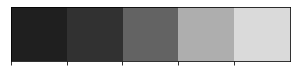

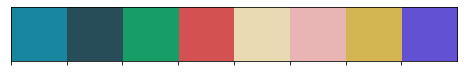

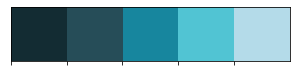

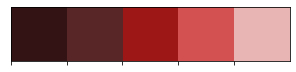

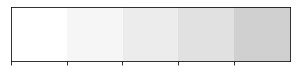

In [3]:
colors_dark = ["#1F1F1F", "#313131", '#636363', '#AEAEAE', '#DADADA']
colors_mix = ["#17869E", '#264D58', '#179E66', '#D35151', '#E9DAB4', '#E9B4B4', '#D3B651', '#6351D3']
colors_blue = ["#132C33", "#264D58", '#17869E', '#51C4D3', '#B4DBE9']
colors_red = ["#331313", "#582626", '#9E1717', '#D35151', '#E9B4B4']
colors_white = ["#ffffff","#f6f6f6","#ececec","#e1e1e1","#d0d0d0"]

sns.palplot(colors_dark)
sns.palplot(colors_mix)
sns.palplot(colors_blue)
sns.palplot(colors_red)
sns.palplot(colors_white)

In [4]:
#reading training data set
data= pd.read_csv('/Users/madhurimabiswas/Desktop/SPRING 2022/ms project/g-research-crypto-forecasting/train.csv')

In [5]:
data.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24236806 entries, 0 to 24236805
Data columns (total 10 columns):
 #   Column     Dtype  
---  ------     -----  
 0   timestamp  int64  
 1   Asset_ID   int64  
 2   Count      float64
 3   Open       float64
 4   High       float64
 5   Low        float64
 6   Close      float64
 7   Volume     float64
 8   VWAP       float64
 9   Target     float64
dtypes: float64(8), int64(2)
memory usage: 1.8 GB


In [6]:
data['Volume']

0           1.923301e+01
1           7.838000e+01
2           3.155006e+01
3           6.626713e+03
4           1.210873e+02
                ...     
24236801    4.663725e+03
24236802    3.975460e+00
24236803    2.193732e+06
24236804    1.828508e+05
24236805    1.035123e+02
Name: Volume, Length: 24236806, dtype: float64

In [39]:
data.head()

,timestamp,Asset_ID,Count,Open,High,Low,Close,Volume,VWAP,Target
0,1514764860,2,40.0,2376.5800,2399.5000,2357.1400,2374.5900,19.233005,2373.116392,-0.004218
1,1514764860,0,5.0,8.5300,8.5300,8.5300,8.5300,78.380000,8.530000,-0.014399
2,1514764860,1,229.0,13835.1940,14013.8000,13666.1100,13850.1760,31.550062,13827.062093,-0.014643
3,1514764860,5,32.0,7.6596,7.6596,7.6567,7.6576,6626.713370,7.657713,-0.013922
4,1514764860,7,5.0,25.9200,25.9200,25.8740,25.8770,121.087310,25.891363,-0.008264


In [5]:
#Summary statistics for the data
data.describe(include = 'all').style.applymap(lambda x : "background-color: #B4DBE9")

,timestamp,Asset_ID,Count,Open,High,Low,Close,Volume,VWAP,Target
count,24236806.000000,24236806.000000,24236806.000000,24236806.000000,24236806.000000,24236806.000000,24236806.000000,24236806.000000,24236797.000000,23486468.000000
mean,1577120425.312500,6.292544,286.459348,1432.640492,1436.350391,1429.567599,1432.639977,286852.985610,nan,0.000007
std,33233501.742110,4.091861,867.398158,6029.605020,6039.482419,6020.260688,6029.610647,2433934.645922,nan,0.005679
min,1514764860.000000,0.000000,1.000000,0.001170,0.001195,0.000200,0.001171,-0.366281,-inf,-0.509351
25%,1549011480.000000,3.000000,19.000000,0.267650,0.268160,0.266900,0.267648,141.072477,0.267637,-0.001694
50%,1578371880.000000,6.000000,64.000000,14.288600,14.312500,14.263000,14.289200,1295.414556,14.287687,-0.000043
75%,1606197540.000000,9.000000,221.000000,228.874286,229.300000,228.420000,228.872857,27297.640092,228.872798,0.001602
max,1632182400.000000,13.000000,165016.000000,64805.943750,64900.000000,64670.530000,64808.537275,759755403.142386,inf,0.964170


In [6]:
data.duplicated().sum()

0

In [7]:
#reading asset data set and get the names of asset names with respect to asset id
asset_data = pd.read_csv('/Users/madhurimabiswas/Desktop/SPRING 2022/ms project/g-research-crypto-forecasting/asset_details.csv')

In [8]:
asset_data

,Asset_ID,Weight,Asset_Name
0,2,2.397895,Bitcoin Cash
1,0,4.304065,Binance Coin
2,1,6.779922,Bitcoin
3,5,1.386294,EOS.IO
4,7,2.079442,Ethereum Classic
5,6,5.894403,Ethereum
6,9,2.397895,Litecoin
7,11,1.609438,Monero
8,13,1.791759,TRON
9,12,2.079442,Stellar


#let's visualize how the weights are distributed
plt.subplots(figsize=(20,10))
sns.barplot(x='Asset_Name', y='Weight',
            data=asset_data.sort_values(by=['Weight'],ascending=False),palette='Set2')

In [9]:
#printing the individual assest name
asset_names = [name for name in asset_data['Asset_Name']]
asset_names

['Bitcoin Cash',
 'Binance Coin',
 'Bitcoin',
 'EOS.IO',
 'Ethereum Classic',
 'Ethereum',
 'Litecoin',
 'Monero',
 'TRON',
 'Stellar',
 'Cardano',
 'IOTA',
 'Maker',
 'Dogecoin']

In [10]:
#checking how many unique asset_ids in the dataset
data['Asset_ID'].unique()

array([ 2,  0,  1,  5,  7,  6,  9, 11, 13, 12,  3,  8, 10,  4])

In [7]:
asset_name = ['Binance Coin', 'Bitcoin', 'Bitcoin Cash', 'Cardano', 'Dogecoin', 'EOS.IO',
              'Ethereum','Ethereum Classic', 'IOTA', 'Litecoin', 'Maker', 'Monero', 
              'Stellar', 'TRON']

for index in range(0,14):
    data['Asset_ID'].replace({index : asset_name[index]}, inplace=True)
    
names = data.Asset_ID.unique()
names

array(['Bitcoin Cash', 'Binance Coin', 'Bitcoin', 'EOS.IO',
       'Ethereum Classic', 'Ethereum', 'Litecoin', 'Monero', 'TRON',
       'Stellar', 'Cardano', 'IOTA', 'Maker', 'Dogecoin'], dtype=object)

In [8]:
data.head()

,timestamp,Asset_ID,Count,Open,High,Low,Close,Volume,VWAP,Target
0,1514764860,Bitcoin Cash,40.0,2376.5800,2399.5000,2357.1400,2374.5900,19.233005,2373.116392,-0.004218
1,1514764860,Binance Coin,5.0,8.5300,8.5300,8.5300,8.5300,78.380000,8.530000,-0.014399
2,1514764860,Bitcoin,229.0,13835.1940,14013.8000,13666.1100,13850.1760,31.550062,13827.062093,-0.014643
3,1514764860,EOS.IO,32.0,7.6596,7.6596,7.6567,7.6576,6626.713370,7.657713,-0.013922
4,1514764860,Ethereum Classic,5.0,25.9200,25.9200,25.8740,25.8770,121.087310,25.891363,-0.008264


In [9]:
data.isnull().sum()

timestamp         0
Asset_ID          0
Count             0
Open              0
High              0
Low               0
Close             0
Volume            0
VWAP              9
Target       750338
dtype: int64

In [10]:
#printing the %of null values in the dataset
print("Total Null Target Rows = " ,data["Target"].isnull().sum())
print("Percentage of NUll rows in Training Data = {:.2f}%".format(data["Target"].isnull().sum()*100 / data.shape[0] ))

Total Null Target Rows =  750338
Percentage of NUll rows in Training Data = 3.10%


In [11]:
#counting the number of data points and plotting those points   
asset_count = {}
for i in asset_names:
    count = (data['Asset_ID']==i).sum()
    asset_count[i] = count
Distribution = pd.DataFrame(asset_count.items(),columns = ['Assets','No of data points'])


NameError: name 'asset_names' is not defined

In [ ]:
plt.subplots(figsize=(20,10))
fig = sns.barplot(x="Assets", y="No of data points", data=Distribution,palette=colors_blue)
fig.set_title('Data Distribution of Different assests',fontdict={'color':colors_mix[7],'size':27,
                                       'fontweight':'bold','fontname':'monospace'})
fig.set_xlabel('Crypto Currencies Type',fontsize=17)
fig.set_ylabel('No of Data Points/Rows',fontsize=17)
fig.xaxis.label.set_color(colors_dark[1])
fig.yaxis.label.set_color(colors_dark[1])
plt.xticks(fontsize=14,rotation=20)
plt.yticks(fontsize=14)
plt.show()

In [ ]:
#Making timestamp column the index
data['timestamp'] = pd.to_datetime(data['timestamp'],unit='s')
data.set_index('timestamp',inplace=True)
data.index.dtype 

In [14]:
#let's make a separate dataframes to analyse the data

Bitcoin_cash = data[data['Asset_ID'] == 'Bitcoin Cash']
Binance_coin = data[data['Asset_ID'] == 'Binance Coin']
Bitcoin = data[data['Asset_ID'] == 'Bitcoin']
Eos_io = data[data['Asset_ID'] == 'EOS.IO']
Ethereum_classic = data[data['Asset_ID'] == 'Ethereum Classic']
Ethereum = data[data['Asset_ID'] == 'Ethereum']
Litecoin = data[data['Asset_ID'] == 'Litecoin']
Monero = data[data['Asset_ID'] == 'Monero']
Tron = data[data['Asset_ID'] == 'TRON']
Stellar = data[data['Asset_ID'] == 'Stellar']
Cardano = data[data['Asset_ID'] == 'Cardano']
Iota = data[data['Asset_ID'] == 'IOTA']
Maker = data[data['Asset_ID'] == 'Maker']
Dogecoin = data[data['Asset_ID'] == 'Dogecoin']


In [15]:
#let's resample all datasets

In [16]:
# Resampling all datasets

day = {
    'Open': 'first',
    'High': 'max',
    'Low': 'min',
    'Close': 'last',
    'Volume': 'sum'
}

bitcoin_cash = Bitcoin_cash.resample('D').apply(day)
binance_coin = Binance_coin.resample('D').apply(day)
bitcoin = Bitcoin.resample('D').apply(day)
eos_io = Eos_io.resample('D').apply(day)
ethereum_classic = Ethereum_classic.resample('D').apply(day)
ethereum = Ethereum.resample('D').apply(day)
litecoin = Litecoin.resample('D').apply(day)
monero = Monero.resample('D').apply(day)
tron = Tron.resample('D').apply(day)
stellar = Stellar.resample('D').apply(day)
cardano = Cardano.resample('D').apply(day)
iota = Iota.resample('D').apply(day)
maker = Maker.resample('D').apply(day)
dogecoin = Dogecoin.resample('D').apply(day)

df_list = [bitcoin_cash, binance_coin, bitcoin, eos_io, ethereum_classic, ethereum,
           litecoin, monero, tron, stellar, cardano, iota, maker, dogecoin]

TypeError: Only valid with DatetimeIndex, TimedeltaIndex or PeriodIndex, but got an instance of 'Int64Index'

In [ ]:
bitcoin_cash.head()

In [32]:
date_buttons = [
{'count':  4, 'step': "year", 'stepmode': "todate", 'label': "Year"},
{'count':  6, 'step': "month", 'stepmode': "todate", 'label': "Month"},
{'count': 60, 'step': "day", 'stepmode': "todate", 'label': "Week"},
{'count': 20, 'step': "day", 'stepmode': "todate", 'label': "Day"},
               ]

buttons = []
i = 0
vis = [False] * 14
for df in df_list:
    vis[i] = True
    buttons.append({ 'label' : names[i],
                     'method' : 'update',
                     'args'   : [{'visible' : vis},
                                 {'title'  : names[i] + ' Chart'}] })
    i+=1
    vis = [False] * 14

fig = go.Figure()

for df in df_list:
    fig.add_trace(go.Candlestick(x     = df.index,
                                 open  = df['Open'],
                                 high  = df['High'],
                                 low   = df['Low'],
                                 close = df['Close'],
                                 increasing_line_color= colors_white[1],
                                 decreasing_line_color= colors_mix[3]))

fig.update_xaxes(
        tickfont = dict(size=15, family = 'monospace', color=colors_white[1]),
        tickmode = 'array',
        ticklen = 6,
        showline = False,
        showgrid = True,
        gridcolor = '#595959',
        ticks = 'outside')

fig.update_yaxes(
        tickfont = dict(size=15, family = 'monospace', color=colors_white[1]),
        tickmode = 'array',
        showline = False,
        ticksuffix = '$',
        showgrid = True,
        gridcolor = '#595959',
        ticks = 'outside')    
    
    
fig.update_layout(height = 650,
                  font_family   = 'monospace',
                  xaxis         = dict(rangeselector = dict(buttons = date_buttons)),
                  updatemenus   = [dict(type = 'dropdown',
                                        x = 1,
                                        y = 1.15,
                                        showactive = True,
                                        active = 2,
                                        buttons = buttons)],
                  title         = dict(text = 'Cryptocurrency Candlestick<br>Dashboard',
                                       font = dict(color = colors_white[1]), 
                                       x = 0.525),
                  plot_bgcolor  = colors_mix[1],
                  paper_bgcolor = colors_mix[1],
                  font          = dict(color='#858585'), 
                  annotations   = [
                                  dict( text = "<b>Choose<br>Crypto<b> : ",
                                        font = dict(size = 12),
                                        showarrow=False,
                                        x = 0.96, y = 1.25,
                                        xref = 'paper', yref = "paper",
                                        align = "left")])
    
    
for i in range(0,14):
    fig.data[i].visible = False
fig.data[2].visible = True

fig.show()

In [123]:
date_buttons = [
{'count':  4, 'step': "year", 'stepmode': "backward", 'label': "Year"},
{'count':  6, 'step': "month", 'stepmode': "todate", 'label': "Month"},
{'count': 60, 'step': "day", 'stepmode': "todate", 'label': "Week"},
{'count': 20, 'step': "day", 'stepmode': "todate", 'label': "Day"},
               ]

fig = make_subplots(rows=2, cols=1, shared_xaxes=True, 
               vertical_spacing=0.3, subplot_titles=('', 'Volume'), row_width=[0.3, 0.8])


buttons = []
i = 0
vis = [False] * 14

for df in df_list:
    vis[i] = True
    buttons.append({ 'label' : names[i],
                     'method' : 'update',
                     'args'   : [{'visible' : vis},
                                 {'title'  : names[i] + ' Linechart'}] })
    i+=1
    vis = [False] * 14


for df in df_list:
    fig.add_trace(go.Scatter(x = df.index,
                             y = df['Open'],
                             mode = 'lines',
                             marker =  dict(color = colors_white[1])), row=1, col=1)
    
for df in df_list:
    fig.add_trace(go.Bar(x = df.index,
                         y = df['Volume'],
                         marker =  dict(color = colors_white[1])), row=2, col=1)

fig.update_xaxes(
        tickfont = dict(size=15, family = 'monospace', color='#B8B8B8'),
        tickmode = 'array',
        ticklen = 6,
        showline = False,
        showgrid = True,
        gridcolor = '#595959',
        ticks = 'outside')

fig.update_yaxes(
        tickfont = dict(size=15, family = 'monospace', color='#B8B8B8'),
        tickmode = 'array',
        showline = False,
        showgrid = True,
        gridcolor = '#595959',
        ticks = 'outside')    
    
    
fig.update_layout(showlegend = False,
                  height = 650,
                  font_family   = 'monospace',
                  xaxis         = dict(rangeselector = dict(buttons = date_buttons)),
                  updatemenus   = [dict(type = 'dropdown',
                                        x = 1,
                                        y = 1.15,
                                        showactive = True,
                                        active = 0,
                                        buttons = buttons)],
                  title         = dict(text = 'Cryptocurrency Linechart Dashboard<br>with Volumes',
                                       font = dict(color = colors_white[1]), 
                                       x = 0.5),
                  plot_bgcolor  = colors_mix[1],
                  paper_bgcolor = colors_mix[1],
                  font          = dict(color='#858585'),
                  annotations   = [dict(text = "Choose Crypto :",
                                        font = dict(size = 10, color ='#44eff2'),
                                        showarrow=False,
                                        x = 1, y = 1.25,
                                        xref = 'paper', yref = "paper",
                                        align = "left"),                                
                                   dict(text = "<----DRAG HERE TO MOVE---->",
                                        font = dict(size = 10, color =colors_red[3]),
                                        showarrow=False,
                                        x = 0.5, y = 0.45,
                                        xref = 'paper', yref = "paper",
                                        align = "left")])

for i in range(1,14):
    fig.data[i].visible = False

fig.show()

In [124]:
def indicators(df=None, title='Chart', symbol = 'Candlesticks'):
    
    layout1 = cf.Layout(height=1250,
                  font_family   = 'monospace',
                  xaxis         = dict( rangeselector = dict(buttons = date_buttons),
                                        tickfont = dict(size=12, color='#d4d4d4'),
                                        tickmode = 'array',
                                        ticklen = 6,
                                        showline = False,
                                        showgrid = True,
                                        gridcolor = '#595959',
                                        ticks = 'outside'),

                  yaxis         = dict(
                                       tickfont = dict(size=15, color='#d4d4d4'),
                                        tickmode = 'array',
                                        showline = False,
                                        ticksuffix = '$',
                                        showgrid = True,
                                        gridcolor = '#595959',
                                        ticks = 'outside'),

                  title         = dict(text = '{} chart<br>with Indicators'.format(title),
                                       font = dict(color = '#FFFFFF'), 
                                       x = 0.5),
                    
                  legend        = dict(orientation="h",
                                       yanchor="bottom", y=0.92,
                                       xanchor="center", x=0.5),
                                       
                  plot_bgcolor  = colors_mix[1],
                  paper_bgcolor = colors_mix[1],
                  font          = dict(color='#858585'),
                  annotations   = [dict(text = " ",
                                        font = dict(size = 1, color ='white'),
                                        showarrow=False,
                                        x = 1, y = 1.25,
                                        xref = 'paper', yref = "paper",
                                        align = "left"),                                
                                   dict(text = "RSI",
                                        font = dict(size = 15, color ='white'),
                                        showarrow=False,
                                        x = 0.5, y = 0.62,
                                        xref = 'paper', yref = "paper",
                                        align = "left"),
                                   dict(text = "Volume",
                                        font = dict(size = 15, color ='white'),
                                        showarrow=False,
                                        x = 0.5, y = 0.38,
                                        xref = 'paper', yref = "paper",
                                        align = "left"),
                                   dict(text = "MACD",
                                        font = dict(size = 15, color ='white'),
                                        showarrow=False,
                                        x = 0.5, y = 0.14,
                                        xref = 'paper', yref = "paper",
                                        align = "left"),
                                   dict(text = "<-----SLIDER----->",
                                        font = dict(size = 15, color ='white'),
                                        showarrow=False,
                                        x = 0.5, y = -0.06,
                                        xref = 'paper', yref = "paper",
                                        align = "left")]
                       )
    
    qf = cf.QuantFig(df, name = symbol, down_color='red')

    qf.add_sma([100], width=2, color=['white'])

    qf.add_rsi(periods=14, color=colors_red[3])

    qf.add_volume(color='#999999')

    qf.add_macd(color = ['yellow', 'white'])

    qf.add_bollinger_bands(periods=20, boll_std=2 ,colors=['orange','grey'], fill=True)

    qf.iplot(layout = layout1)
    
fig.show()

In [ ]:
Bitcoin_cash['Volume']
 
    

In [ ]:
# LSTM METHOD 

In [ ]:
from sklearn.preprocessing import MinMaxScaler
scaler=MinMaxScaler(feature_range=(0,1))
bitcoin_cash1=scaler.fit_transform(np.array(bitcoin_cash).reshape(-1,1))

In [ ]:
# train and split 
training_size=int(len(bitcoin_cash1)*0.65)
test_size=len(bitcoin_cash1)-training_size
train_data,test_data=bitcoin_cash1[0:training_size,:],bitcoin_cash1[training_size:len(bitcoin_cash1),:1]

In [ ]:
import numpy
def create_dataset(dataset, time_step=1):
 dataX, dataY = [], []
 for i in range(len(dataset)-time_step-1):
  a = dataset[i:(i+time_step), 0]
  dataX.append(a)
  dataY.append(dataset[i + time_step, 0])
  return numpy.array(dataX), numpy.array(dataY)

time_step = 100
X_train, y_train = create_dataset(train_data, time_step)
X_test, ytest = create_dataset(test_data, time_step)

In [ ]:
#While Implementing any LSTM, we should always reshape our X train in 3-D,
#add 1 the reason behind is the time step and the 1 is given to the LSTM.
X_train =X_train.reshape(X_train.shape[0],X_train.shape[1] , 1)
X_test = X_test.reshape(X_test.shape[0],X_test.shape[1] , 1)

In [ ]:
#Then import required modules for the stacked LSTM.
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import LSTM
model=Sequential()
model.add(LSTM(50,return_sequences=True,input_shape=(100,1)))
model.add(LSTM(50,return_sequences=True))
model.add(LSTM(50))
model.add(Dense(1))
model.compile(loss='mean_squared_error',optimizer='adam')

In [ ]:
train_predict=model.predict(X_train)
test_predict=model.predict(X_test)
train_predict=scaler.inverse_transform(train_predict)
test_predict=scaler.inverse_transform(test_predict)

In [ ]:
import math
from sklearn.metrics import mean_squared_error
math.sqrt(mean_squared_error(y_train,train_predict))

In [ ]:
x_input=test_data[341:].reshape(1,-1)
x_input.shape

In [12]:
import math
from sklearn.metrics import mean_squared_error
mean_squared_error(y_train,train_predict)

NameError: name 'y_train' is not defined